In [ ]:
pip install detecto

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from detecto import core, utils, visualize
model = core.Model()

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!wget   http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2

--2022-05-24 12:22:56--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  3.42MB/s    in 27s     

2022-05-24 12:23:23 (2.30 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



In [ ]:
!bunzip2 /content/shape_predictor_68_face_landmarks.dat.bz2

Ratio:  tensor(0.0525)
tensor(176.1791) cm
tensor([[2564.5667, 1155.7334, 2980.1694, 1734.3583],
        [ 983.5019, 3476.5002, 1439.3966, 4124.6079],
        [1212.1874,  733.9501, 2255.6050, 4454.6113],
        [ 999.3310, 3798.1438, 1388.4152, 4169.4619],
        [2572.3118, 1114.7958, 2976.2378, 1738.8384],
        [1007.6993, 3478.9827, 1391.2650, 3843.0684]])
Height= 176.18 cms


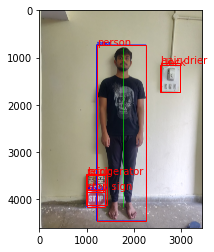

In [ ]:
import glob
import cv2
from PIL import Image,ImageOps
from PIL.ExifTags import TAGS
import dlib
import math

cv_img = []
d=0

# To read image from google drive....
image = utils.read_image(r"/content/drive/MyDrive/IMG_20220524_160344.jpg")

image = cv2.GaussianBlur(image,(3,3),0)
labels, boxes, scores = model.predict_top(image)
labels1, boxes1, scores1 = model.predict(image)
predictions = model.predict_top(image)

# print(labels)
#  Checking labels of object detected from our image and using only those which are required for the method.
for i in range(len(labels)):
        if labels[i] in ['person','stop sign']:
            x,y,w,h = boxes[i]
            cv2.rectangle(image,(x,y),(w,h),(0,0,255),10)
            cv2.putText(image,labels[i], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,255),10)
    
# d=d+1
detector = dlib.get_frontal_face_detector() # for front facial detection
predictor = dlib.shape_predictor(r"/content/shape_predictor_68_face_landmarks.dat")

# img1 = cv2.imread('path.tif', 1)
gray = cv2.cvtColor(src=image, code=cv2.COLOR_BGR2GRAY)
faces = detector(gray)
for face in faces:
        '''x1 = face.left() # left point
        y1 = face.top() # top point
        x2 = face.right() # right point
        y2 = face.bottom() # bottom point'''

        # Create landmark object
        landmarks = predictor(image=gray, box=face)

        # Loop through all the points
        x = landmarks.part(8).x
        y = landmarks.part(8).y-landmarks.part(27).y
        # Draw a circle
        #cv2.circle(img=img, center=(x, int(landmarks.part(27).y-(y))), radius=4, color=(0, 255, 0), thickness=-1)
        break;

# Declaring remarr array variable to detect y coordinate of objects which are placed in the image...
remarr=[]
for i in range(len(labels)):
        if labels[i]=='stop sign' or labels[i]=='no':
            remarr.append(boxes[i][3])
            #a1,b1,c1,d1=boxes[i]
            #print(b1,a1)
            #print(d1,c1)

# print(remarr)
res1=max(remarr)-(landmarks.part(27).y-(5*y/6))    
cv2.line(image,(x,int(landmarks.part(27).y-(5*y/6))),(x,max(remarr)),(0,255,0),7)
cv2.imwrite(r"/content/drive/MyDrive/b01.jpg",image)
# print(res1)
box_length=0;
idx=0;
for i in range(len(labels)):
  if labels[i]=='stop sign':
    box_length=boxes[i][3]-boxes[i][1]
    idx=i;


ratio=19.5/box_length
print("Ratio: ",ratio)
height=ratio*res1
print(height,"cm")

#  to check y co-ordinates..
# print(boxes[idx][3])
# print(boxes[idx][1])

# print(type(labels))
# print(type(scores))
# print(labels)
print(boxes)
# print(scores)
# print(type(labels1))
# print(type(scores1))
# print(labels1)
# print(boxes1)
# print(scores1)


# print(boxes)
# print("Length of object in pixels:",(boxes[0][3]-boxes[0][1]))
# print(scores)
# print(labels)


    
# rounding off the height upto 2 decimal places and printing the result...   
a = round(float(height),2)
print("Height=",a,"cms")


# predictions = model.predict(image)

# From these predictions, we can plot the results using the detecto.visualize module.
visualize.show_labeled_image(image, boxes, labels)
# print(boxes)
# for i in range(len(labels)):
#     if labels[i] in ['person','remote','cell phone','bottle','sports ball']:
#         x,y,w,h = boxes[i]
#         cv2.rectangle(image,(x,y),(w,h),(0,0,255),10)
#         cv2.putText(image,labels[i], (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 3, (0,0,255),10)

In [ ]:
print(labels)

['clock', 'refrigerator', 'person', 'stop sign', 'hair drier', 'book']


In [ ]:
a = round(float(height),2)
print("Height=",a,"cms")

Height= 176.18 cms


In [ ]:
font = cv2.FONT_HERSHEY_SIMPLEX
org = (450, 3600)
fontScale = 4
color = (0, 0, 255)
thickness = 11
ima = cv2.putText(image,str(a), org, font,fontScale, color, thickness, cv2.LINE_AA)
    
cv2.imwrite(r"/content/drive/MyDrive/b02.jpg",ima)

True

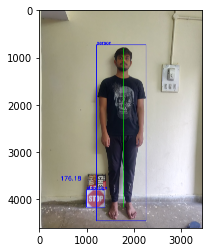

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(ima)

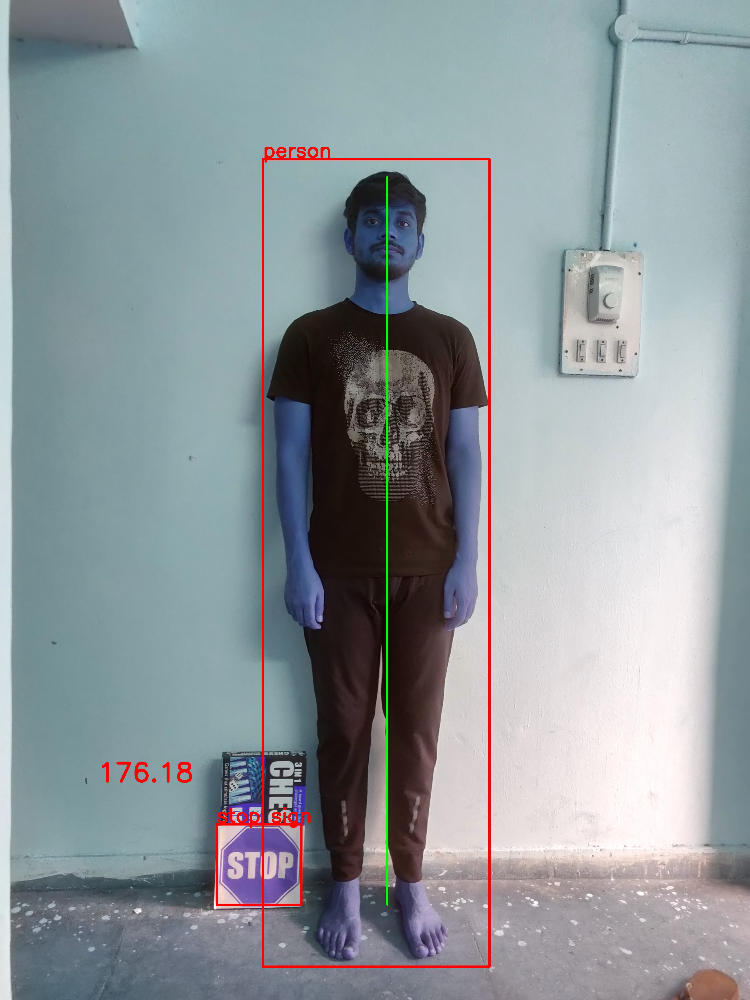

In [23]:
from PIL import Image
Image.open("/content/drive/MyDrive/b02.jpg")